<a href="https://colab.research.google.com/github/ilhamazhar1308/InSAR-Based-Surface-Deformation-Monitoring-Using-Remote-Sensing/blob/main/insar_surface_deformation_remote_sensing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# InSAR-Based Surface Deformation Monitoring Using Remote Sensing
**Case Study: 2025 Tibet Earthquake**

M. Ilham Azhar  
122120099 – Geophysical Engineering  
Sumatra Institute of Technology (ITERA)

This notebook presents a basic InSAR remote sensing workflow to analyze surface deformation
associated with seismic events. The method is applicable to earthquake, volcanic, and geothermal
deformation monitoring, with a specific case study of the 2025 Tibet earthquake.


In [ ]:
import platform, sys, os
if 'google.colab' in sys.modules:
    # install PyGMTSAR stable version from PyPI
    !{sys.executable} -m pip install -q pygmtsar
    # alternatively, nstall PyGMTSAR development version from GitHub
    #!{sys.executable} -m pip install -Uq git+https://github.com/mobigroup/gmtsar.git@pygmtsar2#subdirectory=pygmtsar
    # use PyGMTSAR Google Colab installation script to install binary dependencies
    # script URL: https://github.com/AlexeyPechnikov/pygmtsar/blob/pygmtsar2/pygmtsar/pygmtsar/data/google_colab.sh
    import importlib.resources as resources
    with resources.as_file(resources.files('pygmtsar.data') / 'google_colab.sh') as google_colab_script_filename:
        !sh {google_colab_script_filename}
    # enable custom widget manager as required by recent Google Colab updates
    from google.colab import output
    output.enable_custom_widget_manager()
    # initialize virtual framebuffer for interactive 3D visualization; required for headless environments
    import xvfbwrapper
    display = xvfbwrapper.Xvfb(width=800, height=600)
    display.start()

# specify GMTSAR installation path
PATH = os.environ['PATH']
if PATH.find('GMTSAR') == -1:
    PATH = os.environ['PATH'] + ':/usr/local/GMTSAR/bin/'
    %env PATH {PATH}

# display PyGMTSAR version
from pygmtsar import __version__
__version__

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 122.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.8/111.8 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 90.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 79.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.5/315.5 kB 29.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 77.5 MB/s eta 0:00:00
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)




update-alternatives: using /usr/bin/gcc-9 to provide /usr/bin/gcc (gcc) in auto mode
There is only one alternative in link group gcc (providing /usr/bin/gcc): /usr/bin/gcc-9
Nothing to configure.
gcc (Ubuntu 9.5.0-1ubuntu1~22.04) 9.5.0
 
Usage: make_slc_s1

'2025.4.8.post1'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import xarray as xr
import numpy as np
import pandas as pd
import geopandas as gpd
import json
from dask.distributed import Client
import dask
# plotting modules
import pyvista as pv
# magic trick for white background
pv.set_plot_theme("document")
import panel
panel.extension(comms='ipywidgets')
panel.extension('vtk')
from contextlib import contextmanager
import matplotlib.pyplot as plt
@contextmanager
def mpl_settings(settings):
    original_settings = {k: plt.rcParams[k] for k in settings}
    plt.rcParams.update(settings)
    yield
    plt.rcParams.update(original_settings)
plt.rcParams['figure.figsize'] = [12, 4]
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.titlesize'] = 24
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
%matplotlib inline

In [ ]:
from pygmtsar import S1, Stack, tqdm_dask, ASF, Tiles

# recent Google Colab changes in early September 2025 broke Dask+Xarray NetCDF multithedded processing (again)
# workaround below disables multitheading when it does not work, degrading performance and increasing RAM usage.
if 'google.colab' in sys.modules:
    methods = {
        "load_dem":  "synchronous",
        "save_cube": "compute",
        "save_stack":"compute",
    }
    for m, kind in methods.items():
        if not hasattr(Stack, f"_{m}"):
            setattr(Stack, f"_{m}", getattr(Stack, m))
        def _make_wrapper(name, kind):
            orig = getattr(Stack, f"_{name}")
            if kind == "synchronous":
                def _wrapper(self, *args, **kwargs):
                    with dask.config.set(scheduler="synchronous"):
                        return orig(self, *args, **kwargs)
                return _wrapper
            elif kind == "compute":
                def _wrapper(self, *args, **kwargs):
                    if args:
                        return orig(self, args[0].compute() if hasattr(args[0], "compute") else args[0], *args[1:], **kwargs)
                    return orig(self, **kwargs)
                return _wrapper
            else:
                raise NotImplementedError(f"Unknown wrapper kind: {kind}")
        setattr(Stack, m, _make_wrapper(m, kind))

In [ ]:
SCENES = ['S1A_IW_SLC__1SDV_20250105T121424_20250105T121452_057309_070D2E_EF04',
          'S1A_IW_SLC__1SDV_20250117T121423_20250117T121451_057484_07141C_8E02']
ORBIT        = 'A'
SUBSWATH     = 2

In [ ]:
WORKDIR      = 'raw_tibet'
DATADIR      = 'data_tibet'
POLARIZATION = 'VV'

In [ ]:
DEM = f'{DATADIR}/dem.nc'

In [ ]:
geojson = '''
{
  "type": "Feature",
  "geometry": {
    "type": "LineString",
    "coordinates": [[87.2245, 29.3251], [87.7455, 28.3698]]
  },
  "properties": {}
}
'''
AOI = gpd.GeoDataFrame.from_features([json.loads(geojson)])

In [ ]:
# Set these variables to None and you will be prompted to enter your username and password below.
asf_username = 'ilhamazhar'
asf_password = '@Ilhamazhar1308'

In [ ]:
# Set these variables to None and you will be prompted to enter your username and password below.
asf = ASF(asf_username, asf_password)
# Optimized scene downloading from ASF - only the required subswaths and polarizations.
print(asf.download(DATADIR, SCENES, SUBSWATH))

ASF Downloading Sentinel-1 SLC Scenes::   0%|          | 0/2 [00:00<?, ?it/s]

                                      burst_or_scene
0  S1A_IW_SLC__1SDV_20250105T121424_20250105T1214...
1  S1A_IW_SLC__1SDV_20250117T121423_20250117T1214...


Tiles Parallel Downloading:   0%|          | 0/2 [00:00<?, ?it/s]

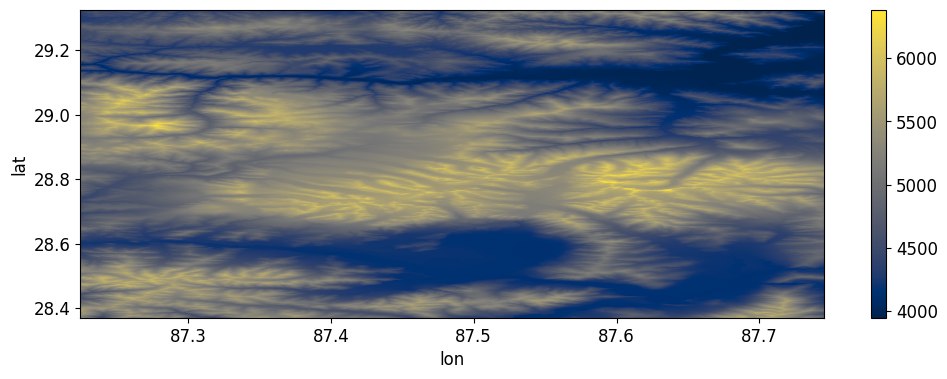

In [ ]:
# scan the data directory for SLC scenes and download missed orbits
S1.download_orbits(DATADIR, S1.scan_slc(DATADIR))
# download Copernicus Global DEM 1 arc-second
Tiles().download_dem(AOI, filename=DEM).plot.imshow(cmap='cividis')

In [ ]:
#simple Dask initialization
if 'client' in globals():
    client.close()
client = Client()
client

INFO:distributed.http.proxy:To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
INFO:distributed.scheduler:State start
INFO:distributed.scheduler:  Scheduler at:     tcp://127.0.0.1:46265
INFO:distributed.scheduler:  dashboard at:  http://127.0.0.1:8787/status
INFO:distributed.scheduler:Registering Worker plugin shuffle
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:42069'
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:40639'
INFO:distributed.scheduler:Register worker addr: tcp://127.0.0.1:43551 name: 0
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:43551
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:55242
INFO:distributed.scheduler:Register worker addr: tcp://127.0.0.1:45721 name: 1
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:45721
INFO:distributed.core:Starting established connection to tcp://127

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 2
Total threads: 2,Total memory: 12.67 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:46265,Workers: 0
Dashboard: http://127.0.0.1:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:43551,Total threads: 1
Dashboard: http://127.0.0.1:39409/status,Memory: 6.34 GiB
Nanny: tcp://127.0.0.1:42069,


In [ ]:
scenes = S1.scan_slc(DATADIR, subswath=SUBSWATH, polarization='VV')

In [ ]:
sbas = Stack(WORKDIR, drop_if_exists=True).set_scenes(scenes)
sbas.to_dataframe()

NOTE: auto set reference scene 2025-01-05. You can change it like Stack.set_reference("2022-01-20")


,datetime,orbit,mission,polarization,subswath,datapath,metapath,noisepath,calibpath,orbitpath,geometry
date,,,,,,,,,,,
2025-01-05,2025-01-05 12:14:24,A,S1A,VV,2,data_tibet/S1A_IW_SLC__1SDV_20250105T121424_20...,data_tibet/S1A_IW_SLC__1SDV_20250105T121424_20...,None,None,data_tibet/S1A_OPER_AUX_POEORB_OPOD_20250125T0...,"MULTIPOLYGON (((87.09724 27.94383, 87.14682 27..."
2025-01-17,2025-01-17 12:14:23,A,S1A,VV,2,data_tibet/S1A_IW_SLC__1SDV_20250117T121423_20...,data_tibet/S1A_IW_SLC__1SDV_20250117T121423_20...,None,None,data_tibet/S1A_OPER_AUX_POEORB_OPOD_20250206T0...,"MULTIPOLYGON (((87.0979 27.94408, 87.14748 27...."


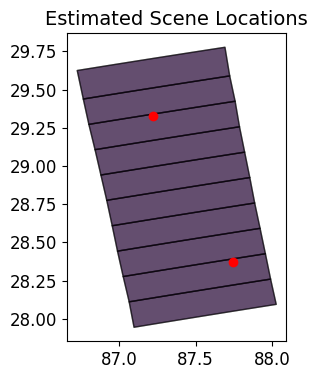

In [ ]:
sbas.plot_scenes(AOI=AOI)

In [ ]:
sbas.compute_reframe(AOI)

Reframing:   0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:
sbas.load_dem(DEM, AOI)

Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

In [ ]:
#use default 60m coordinates grid
sbas.compute_align()

Preparing Reference:   0%|          | 0/1 [00:00<?, ?it/s]

Aligning Repeat:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#use default file coordinates grid
sbas.compute_geocode()

Radar Transform Computing:   0%|          | 0/1 [00:00<?, ?it/s]

Radar Transform Indexing:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

INFO:distributed.scheduler:Receive client connection: Client-worker-47acb52f-ce14-11f0-aee9-0242ac1c000c
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:38608
INFO:distributed.scheduler:Receive client connection: Client-worker-47bce4b6-ce14-11f0-aeec-0242ac1c000c
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:38624


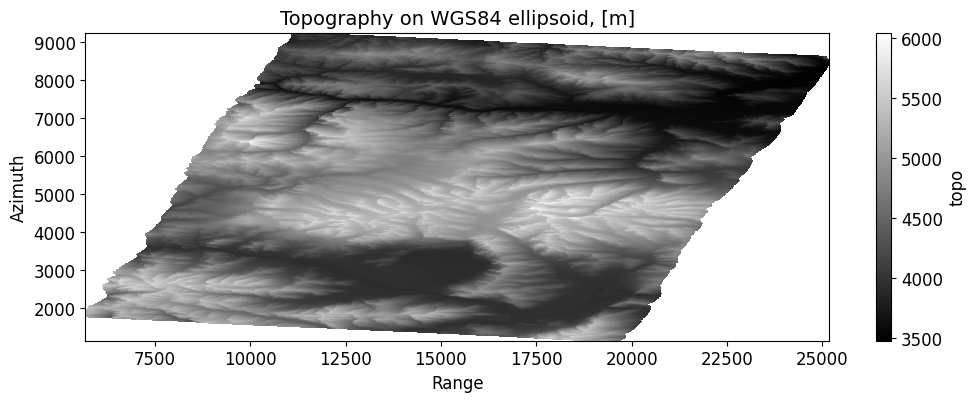

In [ ]:
sbas.plot_topo()
plt.savefig('Topography on WGS84 ellipsoid, [m].jpg')

In [ ]:
# for a pair of scenes only two interferograms can be produced
# this one is selected for scenes sorted by the date in direct order
pairs = [sbas.to_dataframe().index]
pairs

[Index(['2025-01-05', '2025-01-17'], dtype='object', name='date')]

In [ ]:
# load radar topography
topo = sbas.get_topo()
# load Sentinel-1 data
data = sbas.open_data()
# Gaussian filtering 200m cut-off wavelength with multilooking 1x4 on Sentinel-1 intensity
intensity15m = sbas.multilooking(np.square(np.abs(data)), wavelength=200, coarsen=(1,4))
# calculate phase difference with topography correction
phase = sbas.phasediff(pairs, data, topo)
# Gaussian filtering 400m cut-off wavelength with 1:4 range multilooking
phase15m = sbas.multilooking(phase, wavelength=200, coarsen=(1,4))
# correlation with 1:4 range decimation to about 15m resolution
corr15m = sbas.correlation(phase15m, intensity15m)
# Goldstein filter in 32 pixel patch size on square grid cells produced using 1:4 range multilooking
phase15m_goldstein = sbas.goldstein(phase15m, corr15m, 32)
# convert complex phase difference to interferogram
intf15m = sbas.interferogram(phase15m_goldstein)
# decimate the 1:4 multilooking grids to 60m resolution
decimator = sbas.decimator()
# compute together because correlation depends on phase, and filtered phase depends on correlation.
tqdm_dask(result := dask.persist(decimator(corr15m), decimator(intf15m)), desc='Compute Phase and Correlation')
# unpack results for a single interferogram
corr60m, intf60m = [grid[0] for grid in result]

Compute Phase and Correlation:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

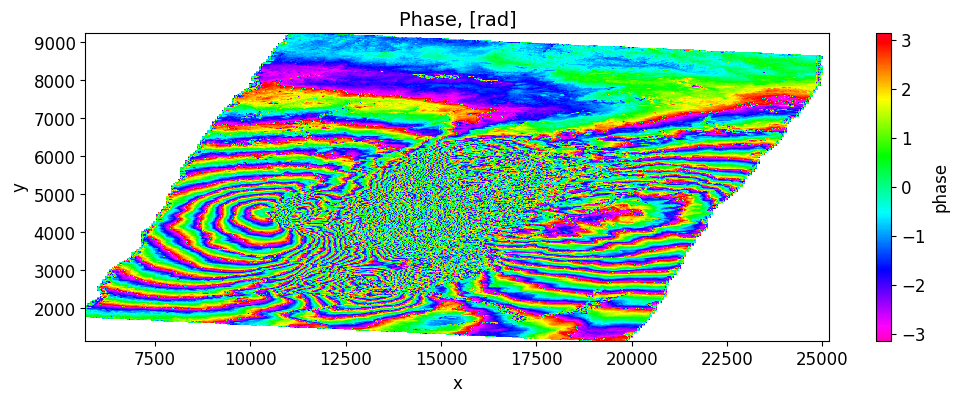

In [ ]:
sbas.plot_interferogram(intf60m)
plt.savefig('Phase, [rad].jpg')

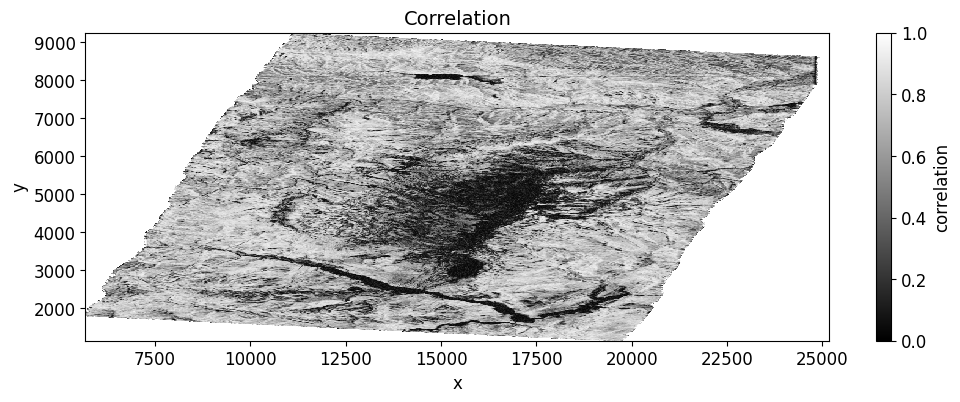

In [ ]:
sbas.plot_correlation(corr60m)
plt.savefig('Correlation.jpg')

In [ ]:
sbas.export_vtk(intf60m[::3,::3], 'intf')

Exporting WGS84 VTK(s):   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# build interactive 3D plot
plotter = pv.Plotter(notebook=True)
plotter.add_mesh(pv.read('intf.vtk').scale([1, 1, 0.00002], inplace=True), scalars='phase', cmap='turbo', ambient=0.1, show_scalar_bar=True)
plotter.show_axes()
plotter.show(screenshot='3D Interferogram.png', jupyter_backend='panel', return_viewer=True)
plotter.add_title(f'Interactive Interferogram on DEM', font_size=32)
plotter._on_first_render_request()
panel.panel(
    plotter.render_window, orientation_widget=plotter.renderer.axes_enabled,
    enable_keybindings=False, sizing_mode='stretch_width', min_height=600
)

VTKRenderWindowSynchronized(vtkXOpenGLRenderWindow, color_mappers=[LinearColorMapper(id='bf7...], min_height=600, orientation_widget=True, sizing_mode='stretch_width')

In [ ]:
# mask low-coherence areas using threshold value 0.1
tqdm_dask(unwrap := sbas.unwrap_snaphu(intf60m, corr60m.where(corr60m>=0.1)).persist(), desc='SNAPHU Unwrapping')

SNAPHU Unwrapping:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

In [ ]:
# geocode to geographic coordinates and crop empty borders
unwrap_ll = sbas.cropna(sbas.ra2ll(unwrap.phase))

In [ ]:
# geocode to geographic coordinates and crop empty borders
los_disp_mm_ll = sbas.cropna(sbas.ra2ll(sbas.los_displacement_mm(unwrap.phase)))

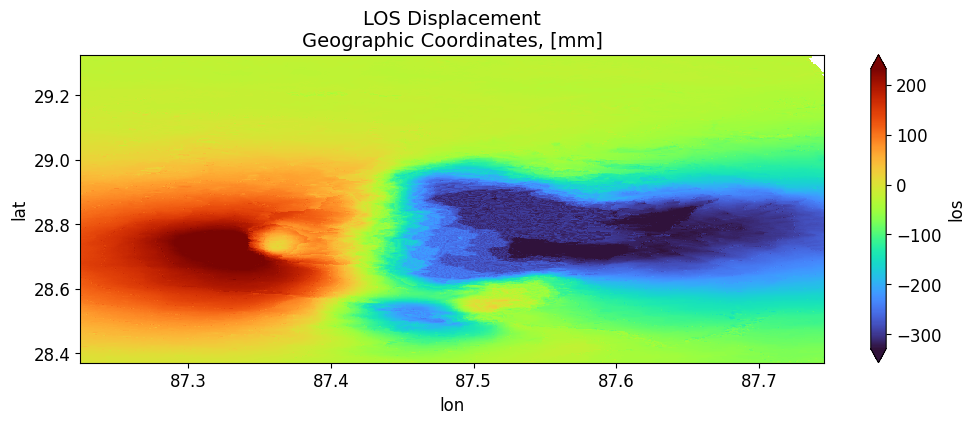

In [ ]:
sbas.plot_displacement(los_disp_mm_ll, caption='LOS Displacement\nGeographic Coordinates, [mm]', quantile=[0.01, 0.99])
plt.savefig('LOS Displacement Geographic Coordinates, [mm].jpg')

In [ ]:
sbas.export_vtk(los_disp_mm_ll[::3,::3], 'los')

Exporting WGS84 VTK(s):   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# build interactive 3D plot
plotter = pv.Plotter(notebook=True)
plotter.add_mesh(pv.read('los.vtk').scale([1, 1, 0.00002], inplace=True), scalars='los', cmap='turbo', ambient=0.1, show_scalar_bar=True)
plotter.show_axes()
plotter.show(screenshot='3D LOS Displacement.png', jupyter_backend='panel', return_viewer=True)
plotter.add_title(f'Interactive LOS Displacement on DEM', font_size=32)
plotter._on_first_render_request()
panel.panel(
    plotter.render_window, orientation_widget=plotter.renderer.axes_enabled,
    enable_keybindings=False, sizing_mode='stretch_width', min_height=600
)

VTKRenderWindowSynchronized(vtkXOpenGLRenderWindow, color_mappers=[LinearColorMapper(id='07c...], min_height=600, orientation_widget=True, sizing_mode='stretch_width')